# Домашнее задание 2. StarGAN

### Загрузка данных
В данном задании вам предстоит работать с CelebA 64x64 и генерировать новые лица с заданными аттрибутами

In [1]:
#!g1.1
import requests
url = 'https://raw.githubusercontent.com/vpozdnyakov/DeepGenerativeModels/spring-2022/utils/datasets/celeba.py'
open('celeba.py', 'wb').write(requests.get(url).content);
url = 'https://raw.githubusercontent.com/vpozdnyakov/DeepGenerativeModels/spring-2022/data/celeba/list_attr_celeba.txt'
open('list_attr_celeba.txt', 'wb').write(requests.get(url).content);


In [2]:
#!g1.1

# !pip install gdown
# !pip install natsort

In [3]:
#!g1.1

from celeba import CelebADataset
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import math
from tqdm.auto import trange, tqdm

from torch import Tensor

Загрузим человекочитаемые названия доменов

In [4]:
#!g1.1

with open('list_attr_celeba.txt', 'r') as f:
    attr_name = np.array(f.readline().split(' ')[:-1])
attr_name

array(['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive',
       'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
       'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair',
       'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee',
       'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male',
       'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard',
       'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
       'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair',
       'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick',
       'Wearing_Necklace', 'Wearing_Necktie', 'Young'], dtype='<U19')

In [5]:
#!g1.1

t_normalize = lambda x: x * 2 - 1
t_invnormalize = lambda x: (x + 1) / 2
transform=transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    t_normalize,
])

Мы будем использовать урезанный датасет (`crop=True`) для быстрой загрузки на диск.

Для обучения модели вам нужно будет загрузить полную версию датасета.

Перед отправкой тетрадки в автопроверку ***ПРОВЕРЬТЕ*** что `crop=True`, иначе ваше решение будет таймаутиться

Главная проблема мультидоменной генерации на селебе - наличие большого количества "бесполезных" классов, например 'Arched_Eyebrows', 'Attractive' 'Bags_Under_Eyes итд. Чтобы сделать задачу чуть проще, в этой домашке мы предлагаем вам взять 10 аттрибутов и учить im2im только на них

In [6]:
#!g1.1

from random import randint

class CelebaCustomDataset(CelebADataset):
    def __getitem__(self, idx):
        indices = [8, 9, 11, 15, 16, 20, 22, 28, 35, 39]
        image, target = super().__getitem__(idx)
        target = target['attributes'] == 1
        new_target = target[indices]
        if sum(new_target) == 0:
            return self.__getitem__(randint(0, len(self)))
        return image, new_target


In [7]:
#!g1.1

attr_name = attr_name[[8, 9, 11, 15, 16, 20, 22, 28, 35, 39]]
attr_name

array(['Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Eyeglasses', 'Goatee',
       'Male', 'Mustache', 'Receding_Hairline', 'Wearing_Hat', 'Young'],
      dtype='<U19')

In [8]:
#!g1.1

dataset = CelebaCustomDataset(
    transform=transform,
    attr_file_path='list_attr_celeba.txt',
    crop=False
)
img, attr = dataset[0]
img.shape

torch.Size([3, 64, 64])

### Визуализация датасета

In [9]:
#!g1.1

def plot_img(img, transform):
    plt.imshow(transform(img).permute(1, 2, 0))
    plt.axis('off')

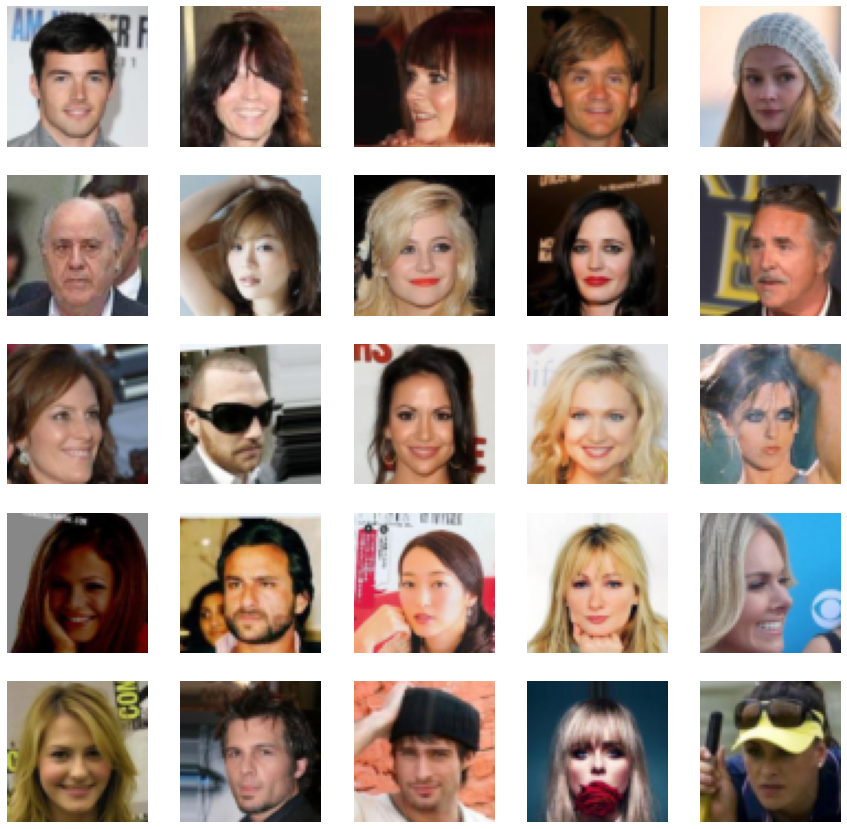

In [10]:
#!g1.1

plt.figure(figsize=(15, 15))

for i in range(25):
    img, attr = dataset[np.random.randint(len(dataset))]
    plt.subplot(5, 5, i + 1)
    plot_img(img, t_invnormalize)
plt.show()

### Задача 1 (3/10 балла). Обучите low-res StarGanV1 на ограниченном подмножестве аттрибутов



В рамках данного задания предлагается реализовать и обучить [StarGAN v1](https://arxiv.org/pdf/1711.09020.pdf) для генерации лиц с заданными аттрибутами

<img src='https://raw.githubusercontent.com/vpozdnyakov/DeepGenerativeModels/spring-2022/images/stargan_v1.png' width=600>

Вы можете добавлять любые дополнительные  параметры и использовать любые трюки для стабилизации/улучшения обучения на свое усмотрение. -->


In [11]:
#!g1.1

class ConvINReLU(nn.Module):
    def __init__(self, in_dim, out_dim, kernel_size, stride, padding):
        super().__init__()
        
        self.net = nn.Sequential(
            nn.Conv2d(in_dim, out_dim, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.InstanceNorm2d(out_dim, affine=True, track_running_stats=True),
            nn.ReLU()
        )
        
    def forward(self, x):
        return self.net(x)

    
class UpConvReLU(nn.Module):
    def __init__(self, in_dim, out_dim, kernel_size, stride, padding):
        super().__init__()
        
        self.net = nn.Sequential(
            nn.Upsample(scale_factor=(2, 2)),
            nn.Conv2d(in_dim, out_dim, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.InstanceNorm2d(out_dim, affine=True, track_running_stats=True),
            nn.ReLU()
        )
        
    def forward(self, x):
        return self.net(x)


class Generator(nn.Module):
    def __init__(self, emb_channels=10):
        """
        you can use any parameters here, for example ->
        hidden_dim: number of channels used in convs 
        """
        super().__init__()
        ### BEGIN SOLUTION
        self.downsample = nn.Sequential(
            ConvINReLU(emb_channels + 3, 64, kernel_size=7, stride=1, padding=3),
            ConvINReLU(64, 128, kernel_size=4, stride=2, padding=1),
            ConvINReLU(128, 256, kernel_size=4, stride=2, padding=1)
        )
        
        self.bottleneck = nn.Sequential(
            *[ConvINReLU(256, 256, kernel_size=3, stride=1, padding=1) for i in range(3)]
        )
        
        self.upsampling = nn.Sequential(
            UpConvReLU(256, 128, kernel_size=3, stride=1, padding=1),
            UpConvReLU(128, 64, kernel_size=3, stride=1, padding=1),
            nn.Conv2d(64, 3, kernel_size=7, stride=1, padding=3),
            nn.Tanh()
        )
        ### END SOLUTION

    def forward(self, x: Tensor, y: Tensor):
        """
        x: original image 
        y: target domain
        """
        ### BEGIN SOLUTION
        y = y[(..., ) + (None, ) * 2].repeat(1, 1, x.shape[2], x.shape[3])
        x = torch.cat((x, y), dim=1)
        
        x = self.downsample(x)
        x = self.bottleneck(x)
        x = self.upsampling(x)
        
        return x
        ### END SOLUTION


In [12]:
#!g1.1

class ConvLeakyReLU(nn.Module):
    def __init__(self, in_dim, out_dim, kernel_size, stride, padding):
        super().__init__()
        
        self.net = nn.Sequential(
            nn.Conv2d(in_dim, out_dim, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.LeakyReLU(0.01)
        )
        
    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, nd=10):
        super().__init__()
        ### BEGIN SOLUTION
        self.back_model = nn.Sequential(
            ConvLeakyReLU(3, 64, kernel_size=4, stride=2, padding=1),
            ConvLeakyReLU(64, 128, kernel_size=4, stride=2, padding=1),
            ConvLeakyReLU(128, 256, kernel_size=4, stride=2, padding=1),
            ConvLeakyReLU(256, 512, kernel_size=4, stride=2, padding=1),
            ConvLeakyReLU(512, 1024, kernel_size=4, stride=2, padding=1),
#             ConvLeakyReLU(1024, 2048, kernel_size=4, stride=2, padding=1),
        )
        
        self.image_discriminator = nn.Sequential(
            nn.Conv2d(1024, 1, kernel_size=3, stride=1, padding=1)
        )
        
        self.class_discriminator = nn.Sequential(
            nn.Conv2d(1024, nd, kernel_size=2, stride=1, padding=0)
        )
        ### END SOLUTION

    def forward(self, x: Tensor):
        ### BEGIN SOLUTION
        x = self.back_model(x)
        
        d_image = self.image_discriminator(x)
        d_class = self.class_discriminator(x)
                        
        return d_image, d_class.squeeze()
        ### END SOLUTION

Дальше идут несколько вспомогательных клеточек которые вы можете использовать, а можете не использовать

In [13]:
#!g1.1

dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, drop_last=True)

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

gen = Generator().to(device)
disc = Discriminator().to(device)

g_optim = torch.optim.Adam(gen.parameters(), 0.0002, betas=(0.5, 0.999))
d_optim = torch.optim.Adam(disc.parameters(), 0.0002, betas=(0.5, 0.999))

In [14]:
#!g1.1
# import wandb

# wandb.init(project="gan_hw2", entity="lemondrok2")

In [15]:
#!g1.1

from tqdm.notebook import tqdm
from torchvision.utils import make_grid
import wandb

def train_models(url=None, starting_epoch=0, num_epoch=20):
    ### BEGIN SOLUTION
    if url is not None:
        import gdown
        gdown.download(url, 'gen.weights', fuzzy=True)
        gen = Generator().to(device)
        gen.load_state_dict(torch.load('gen.weights', map_location=device))
        
        return gen
    else:
        init_lr = g_optim.param_groups[0]['lr']
        
        classification_loss = nn.BCEWithLogitsLoss()
        reconstruction_loss = nn.L1Loss()

        for epoch in tqdm(range(starting_epoch, num_epoch)):
            for batch_num, (image, cls) in enumerate(tqdm(dataloader)):
                new_cls = cls[torch.randperm(len(cls))].to(device).float()
                image, cls = image.to(device), cls.to(device).float()
                
                d_real_image, d_real_class = disc(image)
                with torch.no_grad():
                    g_real_image = gen(image, new_cls)
                    
                d_fake_image, d_fake_class = disc(g_real_image)
                
                d_loss_real_image = -d_real_image.mean()
                d_loss_class = classification_loss(d_real_class, cls)
                d_loss_fake_image = d_fake_image.mean()
                
                alpha_coef = torch.rand(image.shape[0])[(..., ) + (None, )*3].to(device)
                new_image_gradpen = alpha_coef * image.data + (1 - alpha_coef) * g_real_image.data
                new_image_gradpen = new_image_gradpen.requires_grad_(True)
                d_gradpen_image, _ = disc(new_image_gradpen)
                
                grad = torch.autograd.grad(
                    outputs=d_gradpen_image,
                    inputs=new_image_gradpen,
                    grad_outputs=torch.ones(d_gradpen_image.shape).to(device),
                    retain_graph=True,
                    create_graph=True,
                    only_inputs=True
                )[0].reshape(image.shape[0], -1)
                grad_pen = torch.mean((torch.sqrt(torch.sum(grad**2, dim=1)) - 1)**2)                
                
                d_loss_total = d_loss_real_image + 5 * d_loss_class + d_loss_fake_image + 10 * grad_pen
                
                wandb.log({"d_loss_real_image": d_loss_real_image.item(), "d_loss_class": d_loss_class.item(), "d_loss_fake_image": d_loss_fake_image.item(), "grad_pen": grad_pen.item()})
                
                g_optim.zero_grad()
                d_optim.zero_grad()
                d_loss_total.backward()
                d_optim.step()
                
                if batch_num % 5 == 4:
                    g_real_image = gen(image, new_cls)
                    d_fake_image, d_fake_class = disc(g_real_image)
                    g_fake_image = gen(g_real_image, cls)
                    
                    g_loss_fake_image = -d_fake_image.mean()
                    g_loss_class = classification_loss(d_fake_class, new_cls)
                    g_loss_rec_image = reconstruction_loss(g_fake_image, image)
                    g_loss_total = g_loss_fake_image + 5 * g_loss_class + 10 * g_loss_rec_image
                    
                    g_optim.zero_grad()
                    d_optim.zero_grad()
                    g_loss_total.backward()
                    g_optim.step()
                    
                    wandb.log({"g_loss_fake_image": g_loss_fake_image.item(), "g_loss_class": g_loss_class.item(), "g_loss_rec_image": g_loss_rec_image.item()})
                    
            log = True
            if log:
                x_real, y_real = next(iter(dataloader))
                y_real = y_real.float()

                x_real, y_real = x_real.to(device), y_real.to(device)

                for label_index in range(10):
                    plt.figure(figsize=(15, 15))

                    y_trg = y_real.clone()
                    y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

                    with torch.no_grad():
                        x_fake = gen(x_real, y_trg)

                    plt.figure(figsize=(25, 15))
                    x_show = make_grid(torch.cat([x_real[:8], x_fake[:8]], dim=0), nrow=8, normalize=False).detach().cpu()
                    plot_img(x_show, t_invnormalize)

                    wandb.log({"results {}".format(attr_name[label_index]): plt})
                    plt.show()    
            
            if epoch >= num_epoch // 2:
                lr = init_lr * (num_epoch - epoch) / (num_epoch - num_epoch // 2)
                g_optim.param_groups[0]['lr'] = lr
                d_optim.param_groups[0]['lr'] = lr
                
            wandb.log({"lr": g_optim.param_groups[0]['lr']})
            
            torch.save(gen.state_dict(), 'gen{}.ckpt'.format(epoch))
            torch.save(disc.state_dict(), 'disc{}.ckpt'.format(epoch))
                    
        return gen
    ### END SOLUTION

gen = train_models(url='https://drive.google.com/u/0/uc?id=1fUrJnW2Egiamzp7J3PZsfW4libgADxii&export=download')

# gen = train_models()
# gen.load_state_dict(torch.load('gen19.ckpt'))

Downloading...
From: https://drive.google.com/uc?id=1fUrJnW2Egiamzp7J3PZsfW4libgADxii
To: E:\programming\hse\GM\hw3\gen.weights
100%|█████████████████████████████████████████████████████████████████████████████| 11.4M/11.4M [00:00<00:00, 32.9MB/s]


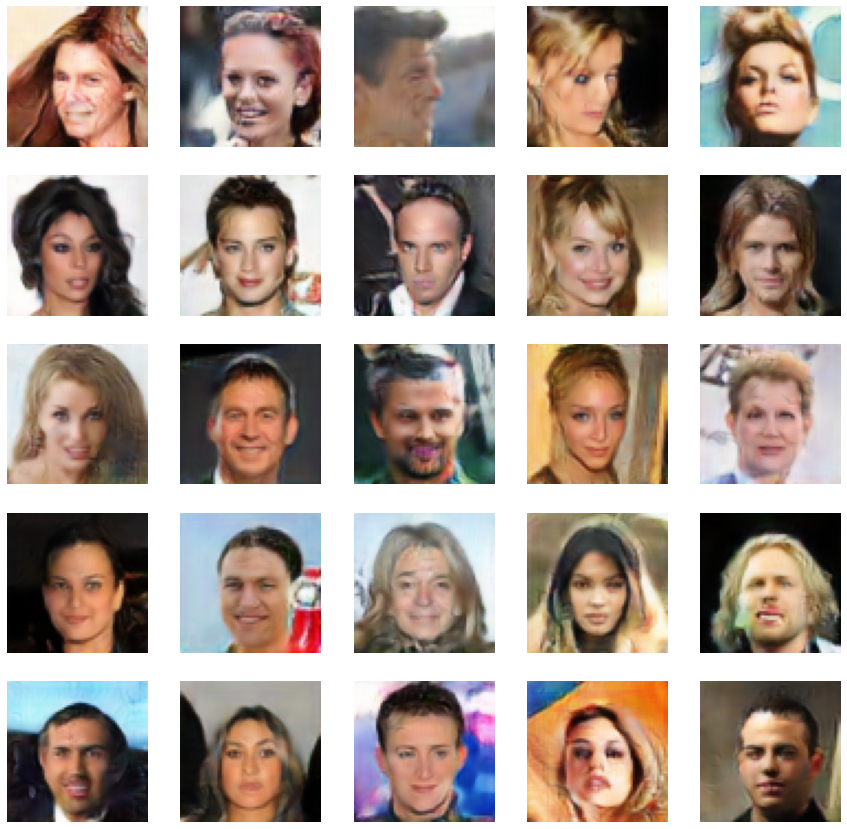

In [16]:
#!g1.1

plt.figure(figsize=(15, 15))

image, label = next(iter(dataloader))

image, label = image.to(device), label.to(device).float()
target_domain = label.flip(dims=[0])

fake_image = gen(image, target_domain)

for index in range(fake_image.shape[0]):
    if index >= 25:
        break
    image = fake_image[index].detach().cpu()
    plt.subplot(5, 5, index + 1)
    plot_img(image, t_invnormalize)
plt.show()



  0%|          | 0/1 [00:00<?, ?it/s]

Target domain: Black_Hair


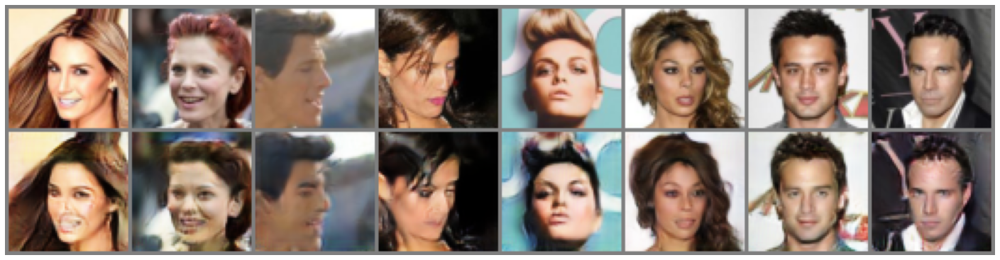

Target domain: Blond_Hair


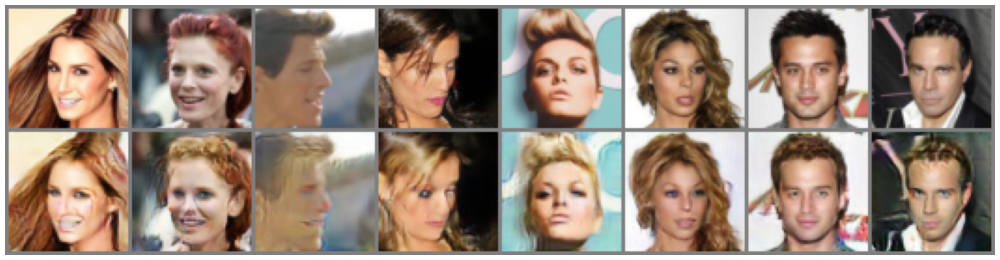

Target domain: Brown_Hair


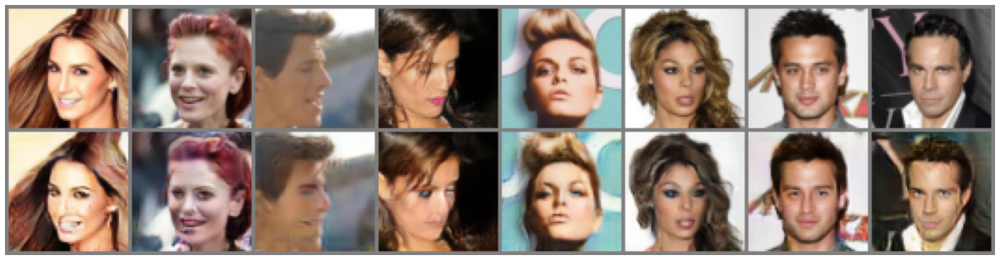

Target domain: Eyeglasses


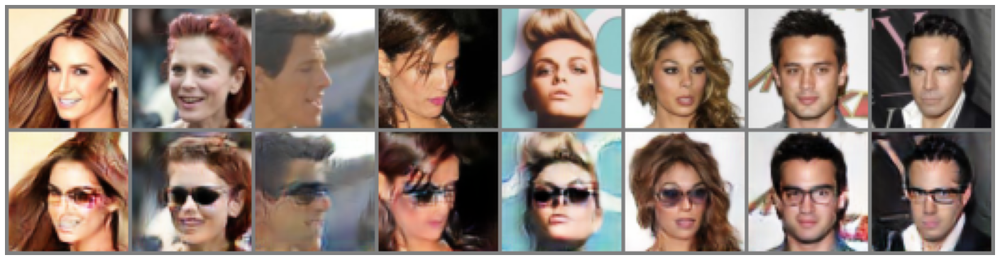

Target domain: Goatee


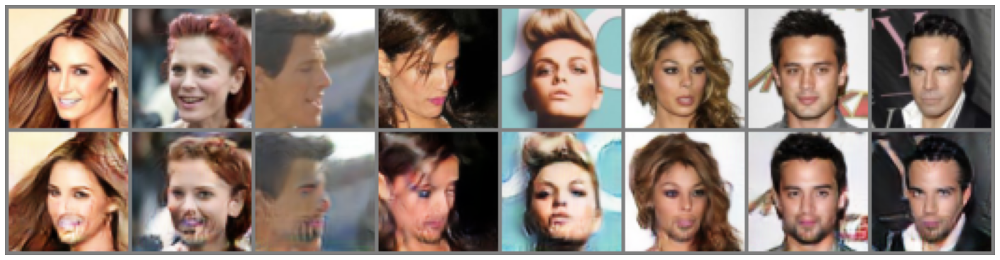

Target domain: Male


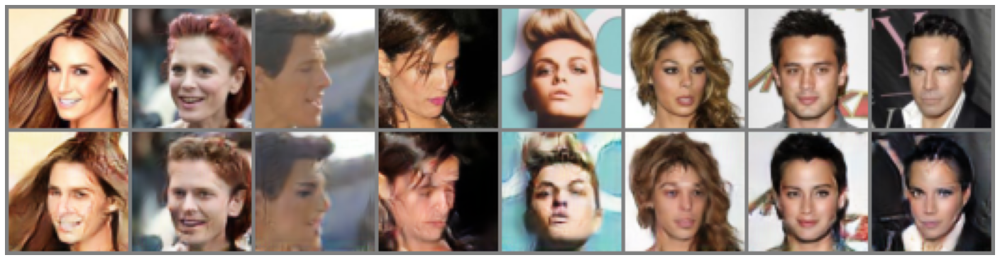

Target domain: Mustache


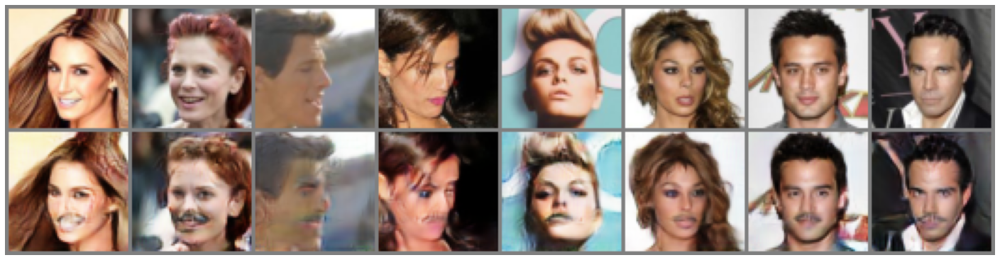

Target domain: Receding_Hairline


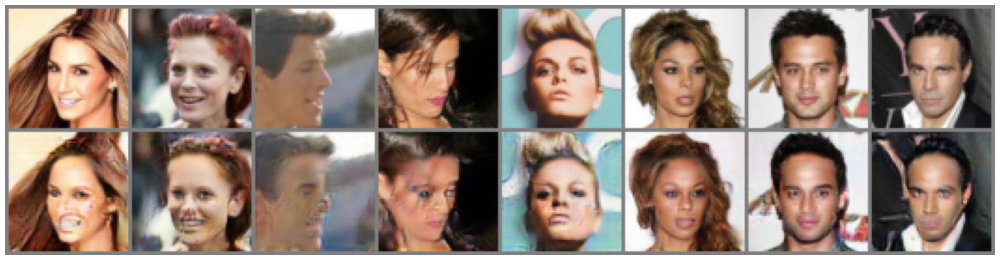

Target domain: Wearing_Hat


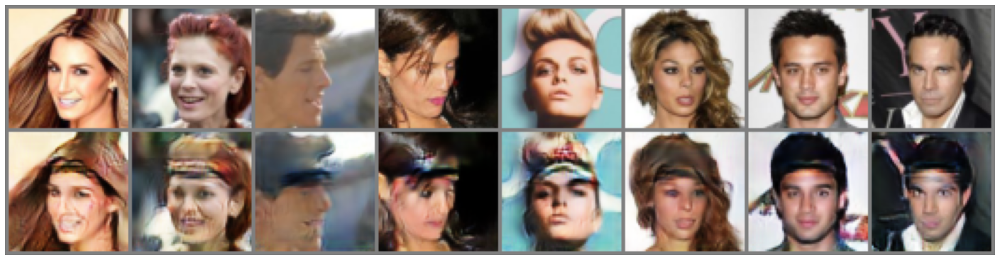

Target domain: Young


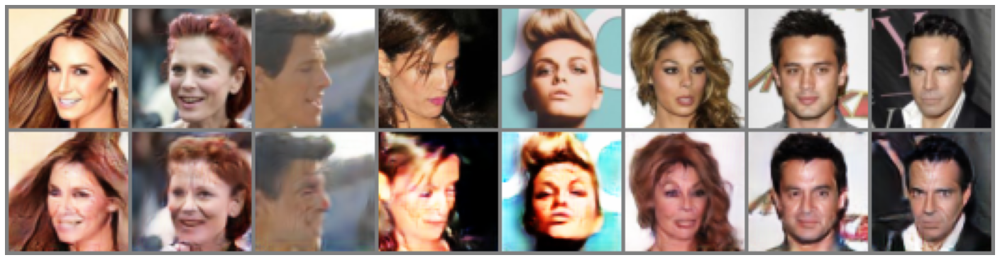

In [17]:
from torchvision.utils import make_grid

test_iters = 1
# gen.eval()

iter_loader = iter(dataloader)

for i in trange(test_iters):
    x_real, y_real = next(iter_loader)
    y_real = y_real.float()

    x_real, y_real = x_real.to(device), y_real.to(device)

    for label_index in range(10):

        y_trg = y_real.clone()
        y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

        print(f'Target domain: {attr_name[label_index]}')

        with torch.no_grad():
            x_fake = gen(x_real, y_trg)

        plt.figure(figsize=(25, 15))
        x_show = make_grid(torch.cat([x_real[:8], x_fake[:8]], dim=0), nrow=8, normalize=False).detach().cpu()
        plot_img(x_show, t_invnormalize)
        plt.show()    


## Additional images

In [18]:
# from torchvision.utils import make_grid

# test_iters = 10
# # gen.eval()

# iter_loader = iter(dataloader)

# for label_index in range(10):

#     for i in trange(test_iters):
#         x_real, y_real = next(iter_loader)
#         y_real = y_real.float()

#         x_real, y_real = x_real.to(device), y_real.to(device)


#         y_trg = y_real.clone()
#         y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

#         print(f'Target domain: {attr_name[label_index]}')

#         with torch.no_grad():
#             x_fake = gen(x_real, y_trg)

#         plt.figure(figsize=(25, 15))
#         x_show = make_grid(torch.cat([x_real[:8], x_fake[:8]], dim=0), nrow=8, normalize=False).detach().cpu()
#         plot_img(x_show, t_invnormalize)
#         plt.show()    


In [19]:
# from PIL import Image

# # Rick Astley
# x_real = transform(Image.open("data/4.png").convert("RGB")).unsqueeze(0)
# y_real = torch.Tensor([0., 0., 1., 0., 0., 1., 0., 0., 0., 1.]).unsqueeze(0)
# x_real, y_real = x_real.to(device), y_real.to(device)

# images = [x_real]

# for label_index in range(10):
#     y_trg = y_real.clone()
    
#     if label_index < 3 and label_index > 0:
#         y_trg[:, 0] = 1 - y_trg[:, 0]
        
#     y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

#     print(f'Target domain: {attr_name[label_index]}')

#     with torch.no_grad():
#         x_fake = gen(x_real, y_trg)
        
#     images.append(x_fake)

# plt.figure(figsize=(25, 10))
# x_show = make_grid(torch.cat(images, dim=0), nrow=6, normalize=False).detach().cpu()
# plot_img(x_show, t_invnormalize)
# plt.show()    


In [20]:
# from PIL import Image

# # Shrek
# x_real = transform(Image.open("data/2.png").convert("RGB")).unsqueeze(0)
# y_real = torch.Tensor([0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]).unsqueeze(0)
# x_real, y_real = x_real.to(device), y_real.to(device)

# images = [x_real]

# for label_index in range(10):
#     y_trg = y_real.clone()
    
#     if label_index < 3 and label_index > 0:
#         y_trg[:, 0] = 1 - y_trg[:, 0]
        
#     y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

#     print(f'Target domain: {attr_name[label_index]}')

#     with torch.no_grad():
#         x_fake = gen(x_real, y_trg)
        
#     images.append(x_fake)

# plt.figure(figsize=(25, 10))
# x_show = make_grid(torch.cat(images, dim=0), nrow=6, normalize=False).detach().cpu()
# plot_img(x_show, t_invnormalize)
# plt.show()    


In [21]:
# from PIL import Image

# # kpop
# x_real = transform(Image.open("data/5.png").convert("RGB")).unsqueeze(0)
# y_real = torch.Tensor([0., 0., 1., 0., 0., 1., 0., 0., 0., 1.]).unsqueeze(0)
# x_real, y_real = x_real.to(device), y_real.to(device)

# images = [x_real]

# for label_index in range(10):
#     y_trg = y_real.clone()
    
#     if label_index < 2:
#         y_trg[:, 2] = 1 - y_trg[:, 2]
        
#     y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

#     print(f'Target domain: {attr_name[label_index]}')

#     with torch.no_grad():
#         x_fake = gen(x_real, y_trg)
        
#     images.append(x_fake)

# plt.figure(figsize=(25, 10))
# x_show = make_grid(torch.cat(images, dim=0), nrow=6, normalize=False).detach().cpu()
# plot_img(x_show, t_invnormalize)
# plt.show()    


In [22]:
# from PIL import Image

# # kpop
# x_real = transform(Image.open("data/6.png").convert("RGB")).unsqueeze(0)
# y_real = torch.Tensor([1., 0., 0., 0., 0., 1., 0., 0., 0., 1.]).unsqueeze(0)
# x_real, y_real = x_real.to(device), y_real.to(device)

# images = [x_real]

# for label_index in range(10):
#     y_trg = y_real.clone()
    
#     if label_index < 3 and label_index > 0:
#         y_trg[:, 0] = 1 - y_trg[:, 0]
        
#     y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

#     print(f'Target domain: {attr_name[label_index]}')

#     with torch.no_grad():
#         x_fake = gen(x_real, y_trg)
        
#     images.append(x_fake)

# plt.figure(figsize=(25, 10))
# x_show = make_grid(torch.cat(images, dim=0), nrow=6, normalize=False).detach().cpu()
# plot_img(x_show, t_invnormalize)
# plt.show()    


In [23]:
# from PIL import Image

# # Trump
# x_real = transform(Image.open("data/8.png").convert("RGB")).unsqueeze(0)
# y_real = torch.Tensor([0., 1., 0., 0., 0., 1., 0., 0., 0., 1.]).unsqueeze(0)
# x_real, y_real = x_real.to(device), y_real.to(device)

# images = [x_real]

# for label_index in range(10):
#     y_trg = y_real.clone()
    
#     if label_index < 3:
#         y_trg[:, 1] = 0
        
#     y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

#     print(f'Target domain: {attr_name[label_index]}')

#     with torch.no_grad():
#         x_fake = gen(x_real, y_trg)
        
#     images.append(x_fake)

# plt.figure(figsize=(25, 10))
# x_show = make_grid(torch.cat(images, dim=0), nrow=6, normalize=False).detach().cpu()
# plot_img(x_show, t_invnormalize)
# plt.show()    


Во время обучения вы можете считать FID вашей модели, но для автопроверки мы решили использовать LPIPS — [Learned Perceptual Image Patch Similarity](https://arxiv.org/abs/1801.03924) как финальную метрику качества. 

Точную цифру для получения баллов за задание мы сообщим позже

In [24]:
#!g1.1
dataset = CelebaCustomDataset(
    transform=transform,
    attr_file_path='list_attr_celeba.txt',
    crop=True
)

bs = 8
dataloader = torch.utils.data.DataLoader(dataset, batch_size=bs, drop_last=True)

In [25]:
#!g1.1

# !pip install git+https://github.com/S-aiueo32/lpips-pytorch.git -q

__Примечание__:

На базовых параметрах весов функций потерь ган за первые 10 эпох учит преобразования, а затем лосс реконстракшна перевешивает, что дает ему пройти порог в lpips (примерно 0.02), но забирает возможность отчетливой генерации усов и шляп. Я сдаю другой вариант, в котором lpips 0.07, но усы, очки, бородка хорошо работают.

In [26]:
#!g1.1

from lpips_pytorch import LPIPS
lpips = LPIPS().to(device)

def evaluate_model(dataloader, generator):
    values = []
    for x_real, label in tqdm(dataloader):
        x_real, label = x_real.to(device), label.to(device).float()
        target_domain = label.flip(dims=[0])

        with torch.no_grad():
            x_fake = generator(x_real, target_domain)

        values.append(lpips(x_fake, x_real).squeeze().item())
    return np.mean(values) / bs
    
evaluate_model(dataloader, gen)

  0%|          | 0/62 [00:00<?, ?it/s]

0.0711132452612923

### Задача 2 (5/10 баллов). Обучите low-res StarGanV2 на ограниченном подмножестве аттрибутов

В рамках второго задания предлагается реализовать и обучить [StarGAN v2](https://arxiv.org/abs/1912.01865)

<img src='https://raw.githubusercontent.com/vpozdnyakov/DeepGenerativeModels/spring-2022/images/stargan_v2.png' width=600>

Вы можете добавлять любые дополнительные  параметры на свое усмотрение.


In [27]:
style_dim = 64


# 3 часа дебагал свой, он работал как в статье, но результат сетки был плохой. Пиршлось забрать в оф репе старгана
class AdaIN(nn.Module):
    def __init__(self, in_dim, style_dim):
        super().__init__()
        self.norm = nn.InstanceNorm2d(in_dim)
        self.fc = nn.Linear(style_dim, in_dim*2)

    def forward(self, x, s):
        h = self.fc(s)
        h = h.view(h.size(0), h.size(1), 1, 1)
        gamma, beta = torch.chunk(h, chunks=2, dim=1)
        return (1 + gamma) * self.norm(x) + beta
    

class InstanceNorm2dIgnoreStyle(nn.InstanceNorm2d):
    def forward(self, x, s):
        return super().forward(x)

    
class ResBlk(nn.Module):
    # from paper: norm -> active -> conv -> norm -> active -> conv -> concat with start -> active
    def __init__(self, resample, norm, in_dim, out_dim, kernel_size, stride, padding):
        super().__init__()
                
        self.skipcon_model = []
        
        self.act1 = nn.LeakyReLU(0.2)
        self.act2 = nn.LeakyReLU(0.2)
        
        self.conv1 = nn.Conv2d(in_dim, in_dim, kernel_size, stride, padding)
        self.conv2 = nn.Conv2d(in_dim, out_dim, kernel_size, stride, padding)
        
        if resample == 'AvgPool':
            self.resample = nn.AvgPool2d(2)
            self.skipcon_model.append(nn.AvgPool2d(2))
        elif resample == 'Upsample':
            self.resample = nn.Upsample(scale_factor=2)
            self.skipcon_model.append(nn.Upsample(scale_factor=2))
            
        if in_dim != out_dim:
            self.skipcon_model.append(nn.Conv2d(in_dim, out_dim, 1))
            
        if norm == 'IN':
            self.norm1 = InstanceNorm2dIgnoreStyle(in_dim)
            self.norm2 = InstanceNorm2dIgnoreStyle(in_dim)
        elif norm == 'AdaIN':
            self.norm1 = AdaIN(in_dim, style_dim)
            self.norm2 = AdaIN(in_dim, style_dim)
            
        self.skipcon_model = nn.Sequential(*self.skipcon_model)
            
    def forward(self, x, style=None):
        skip = self.skipcon_model(x)
        
        if hasattr(self, 'norm1'):
            x = self.norm1(x, style)
        x = self.act1(x)
        x = self.conv1(x)
        
        if hasattr(self, 'resample'):
            x = self.resample(x)
        
        if hasattr(self, 'norm2'):
            x = self.norm2(x, style)
        x = self.act2(x)
        x = self.conv2(x)
        x = x + skip
        
        return x / np.sqrt(2)


class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        ### BEGIN SOLUTION
        self.model1 = [
            # First part
            nn.Conv2d(3, 64, 3, 1, 1)
        ]
        
        self.model2 = nn.ModuleList([            
            # Second part
            ResBlk('AvgPool', 'IN', 64, 128, 3, 1, 1).to(device),
            ResBlk('AvgPool', 'IN', 128, 256, 3, 1, 1).to(device),
            ResBlk('AvgPool', 'IN', 256, 256, 3, 1, 1).to(device),
            ResBlk('AvgPool', 'IN', 256, 256, 3, 1, 1).to(device),
            
            # Third part
            ResBlk('HelpME', 'IN', 256, 256, 3, 1, 1).to(device),
            ResBlk('HelpME', 'IN', 256, 256, 3, 1, 1).to(device),
            ResBlk('HelpME', 'AdaIN', 256, 256, 3, 1, 1).to(device),
            ResBlk('HelpME', 'AdaIN', 256, 256, 3, 1, 1).to(device),
            
            # Fourth part
            ResBlk('Upsample', 'AdaIN', 256, 256, 3, 1, 1).to(device),
            ResBlk('Upsample', 'AdaIN', 256, 128, 3, 1, 1).to(device),
            ResBlk('Upsample', 'AdaIN', 128, 64, 3, 1, 1).to(device),
            ResBlk('Upsample', 'AdaIN', 64, 32, 3, 1, 1).to(device),
        ])
        
        self.model3 = [
            nn.InstanceNorm2d(32, affine=True),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 3, 1, 1, 0),
        ]
        
        self.model1 = nn.Sequential(*self.model1)
        self.model3 = nn.Sequential(*self.model3)
        ### END SOLUTION

    def forward(self, x, s=None, y=None):
        ### BEGIN SOLUTION
        x = self.model1(x)

        for i in range(len(self.model2)):
            x = self.model2[i](x, s)

        x = self.model3(x)
        ### END SOLUTION
        
        return x

In [28]:
class Discriminator(nn.Module):
    def __init__(self, k_dim, d_dim=1):
        super().__init__()
        ### BEGIN SOLUTION
        self.model1 = nn.Sequential(
            # First part
            nn.Conv2d(3, 64, 1, bias=False),
            
            # Second part
            ResBlk('AvgPool', 'LetMeOut', 64, 128, 3, 1, 1),
            ResBlk('AvgPool', 'LetMeOut', 128, 256, 3, 1, 1),
            ResBlk('AvgPool', 'LetMeOut', 256, 512, 3, 1, 1),
            ResBlk('AvgPool', 'LetMeOut', 512, 512, 3, 1, 1),
            ResBlk('AvgPool', 'LetMeOut', 512, 512, 3, 1, 1),
            
            # Third part
            nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 4, 1, 1),
            nn.LeakyReLU(0.2),
        )
        
        self.fcs = nn.ModuleList([
            nn.Linear(512, d_dim).to(device) for _ in range(k_dim)
        ])
        ### END SOLUTION

    def forward(self, x: Tensor, y: Tensor):
        ### BEGIN SOLUTION
        x = self.model1(x)
        x = x.reshape(x.shape[0], x.shape[1])
                
        x = torch.stack(
            [self.fcs[i](x) for i in range(len(self.fcs))], dim=1
        )
        
        return x[torch.LongTensor(range(y.size(0))).to(y.device), y]
        ### END SOLUTION

In [29]:
class StyleEncoder(nn.Module):
    def __init__(self, k_dim, d_dim=64):
        super().__init__()
        ### BEGIN SOLUTION
        self.model1 = nn.Sequential(
            # First part
            nn.Conv2d(3, 64, 1, bias=False),
            
            # Second part
            ResBlk('AvgPool', 'LetMeOut', 64, 128, 3, 1, 1),
            ResBlk('AvgPool', 'LetMeOut', 128, 256, 3, 1, 1),
            ResBlk('AvgPool', 'LetMeOut', 256, 512, 3, 1, 1),
            ResBlk('AvgPool', 'LetMeOut', 512, 512, 3, 1, 1),
            ResBlk('AvgPool', 'LetMeOut', 512, 512, 3, 1, 1),
#             ResBlk('AvgPool', 'LetMeOut', 512, 512, 3, 1, 1),
            
            # Third part
            nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 4, 1, 1),
            nn.LeakyReLU(0.2),
        )
        
        self.fcs = nn.ModuleList([
            nn.Linear(512, d_dim).to(device) for _ in range(k_dim)
        ])
        ### END SOLUTION

    def forward(self, x: Tensor, y: Tensor):
        ### BEGIN SOLUTION
        x = self.model1(x)
        x = x.reshape(x.shape[0], x.shape[1])
        
        x = torch.stack(
            [self.fcs[i](x) for i in range(len(self.fcs))], dim=1
        )
                
        return x[torch.LongTensor(range(y.size(0))).to(y.device), y]
        ### END SOLUTION

In [30]:
class MappingNetwork(nn.Module):
    def __init__(self, k_dim):
        super().__init__()
        ### BEGIN SOLUTION
        self.model1 = nn.Sequential(
            nn.Linear(16, 512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.ReLU(),
        )
        
        self.models2 = nn.ModuleList([
            nn.Sequential(
                nn.Linear(512, 512),
                nn.ReLU(),
                nn.Linear(512, 512),
                nn.ReLU(),
                nn.Linear(512, 512),
                nn.ReLU(),
                nn.Linear(512, 64),
            ).to(device) for _ in range(k_dim)
        ])
        ### END SOLUTION

    def forward(self, z: Tensor, y: Tensor):
        ### BEGIN SOLUTION
        z = self.model1(z)
        
        z = torch.stack(
            [self.models2[i](z) for i in range(len(self.models2))], dim=1
        )
                
        return z[torch.LongTensor(range(y.size(0))).to(y.device), y]
        ### END SOLUTION

In [31]:
### BEGIN SOLUTION

style_enc = StyleEncoder(2).to(device)
mapping = MappingNetwork(2).to(device)
gen = Generator().to(device)
disc = Discriminator(2).to(device)

style_enc_ema = StyleEncoder(2).to(device)
mapping_ema = MappingNetwork(2).to(device)
gen_ema = Generator().to(device)

style_enc_ema.load_state_dict(style_enc.state_dict())
mapping_ema.load_state_dict(mapping.state_dict())
gen_ema.load_state_dict(gen.state_dict())

g_optim = torch.optim.Adam(params=gen.parameters(), lr=1e-4, betas=[0.0, 0.99], weight_decay=1e-4)
d_optim = torch.optim.Adam(params=disc.parameters(), lr=1e-4, betas=[0.0, 0.99], weight_decay=1e-4)
s_optim = torch.optim.Adam(params=style_enc.parameters(), lr=1e-4, betas=[0.0, 0.99], weight_decay=1e-4)
m_optim = torch.optim.Adam(params=mapping.parameters(), lr=1e-6, betas=[0.0, 0.99], weight_decay=1e-4)

### END SOLUTION

In [32]:
gen.load_state_dict(torch.load('genv2.ckpt'))
style_enc.load_state_dict(torch.load('style_encv2.ckpt'))
mapping.load_state_dict(torch.load('mappingv2.ckpt'))
disc.load_state_dict(torch.load('discv2.ckpt'))
style_enc_ema.load_state_dict(torch.load('style_enc_emav2.ckpt'))
mapping_ema.load_state_dict(torch.load('mapping_emav2.ckpt'))
gen_ema.load_state_dict(torch.load('gen_emav2.ckpt'))


<All keys matched successfully>

In [33]:
class CelebaMaleFemaleCustomDataset(CelebADataset):        
    def __getitem__(self, idx):
        image, target = super().__getitem__(idx)
        target = target['attributes'] == 1
        new_target = target[20]
        
        return image, new_target


In [34]:
dataset = CelebaMaleFemaleCustomDataset(
    transform=transform,
    attr_file_path='list_attr_celeba.txt',
    crop=False
)

dataloader = torch.utils.data.DataLoader(dataset, batch_size=64, drop_last=True)

In [35]:
# #!g1.1
# import wandb

# wandb.init(project="gan_hw2", entity="lemondrok2")

In [36]:
latent_dim = 16

def train_models(ckpt_file_path=None, starting_epoch=0, num_epoch=20, starting_step=0):
    ### BEGIN SOLUTION
    if ckpt_file_path:
        checkpoint = torch.load(ckpt_file_path, map_location=torch.device('cpu'))
        generator = Generator()
        generator.load_state_dict(checkpoint['generator'])
        style_encoder = StyleEncoder()
        style_encoder.load_state_dict(checkpoint['style_encoder'])
    else:
        classification_loss = nn.BCEWithLogitsLoss()
        
        step = starting_step
        
        for epoch in tqdm(range(starting_epoch, num_epoch)):
            for batch_num, (image, cls) in enumerate(tqdm(dataloader)):
                image, cls = image.to(device), cls.to(device).long()
                                
                perm1 = torch.randperm(len(image))
                perm2 = torch.randperm(len(image))
                
                image_ref1, image_ref2, cls_target = image[perm1].to(device), image[perm2].to(device), cls[perm1].to(device)
                
                z_target1, z_target2 = torch.randn(len(image), 16).to(device), torch.randn(len(image), 16).to(device)
                
                ################################## DISC with z OMG #################################
                input_image = image.clone()
                input_image.requires_grad_()

                d_real = disc(input_image, cls)
        
                # Basic real disc loss
                real_disc_loss = classification_loss(d_real, torch.full_like(d_real, 1))
                
                # GradPen                
                grad = torch.autograd.grad(
                    outputs=d_real.sum(),
                    inputs=input_image,
                    retain_graph=True,
                    create_graph=True,
                    only_inputs=True
                )[0].reshape(input_image.shape[0], -1)

                grad_pen = torch.mean(torch.sum(grad**2, dim=1)) / 2
                
                # z_target fake disc loss
                with torch.no_grad():
                    style_target = mapping(z_target1, cls_target)
                    image_fake = gen(input_image, s=style_target)
                    
                d_fake = disc(image_fake, cls_target)
                
                fake_disc_loss = classification_loss(d_fake, torch.full_like(d_fake, 0))
                
                disc_loss = (real_disc_loss + fake_disc_loss) + grad_pen
                
                wandb.log({
                    'D z: real_disc_loss': real_disc_loss.item(),
                    'D z: fake_disc_loss': fake_disc_loss.item(),
                    'D z: grad_pen': grad_pen.item(),
                    'D z: disc_loss': disc_loss.item()
                })
                
                g_optim.zero_grad()
                d_optim.zero_grad()
                s_optim.zero_grad()
                m_optim.zero_grad()
                
                disc_loss.backward()
                
                d_optim.step()
                
                del d_real, real_disc_loss, grad, grad_pen, style_target, image_fake, d_fake, fake_disc_loss, disc_loss
                
                ################################## DISC with reference OMG #################################

                input_image = image.clone()
                input_image.requires_grad_()
                
                d_real = disc(input_image, cls)
        
                # Basic real disc loss
                real_disc_loss = classification_loss(d_real, torch.full_like(d_real, 1))
                
                # GradPen                
                grad = torch.autograd.grad(
                    outputs=d_real.sum(),
                    inputs=input_image,
                    retain_graph=True,
                    create_graph=True,
                    only_inputs=True
                )[0].reshape(input_image.shape[0], -1)

                grad_pen = torch.mean(torch.sum(grad**2, dim=1)) / 2
                
                # z_target fake disc loss
                with torch.no_grad():
                    style_target = style_enc(image_ref1, cls_target)
                    image_fake = gen(input_image, s=style_target)
                    
                d_fake = disc(image_fake, cls_target)
                
                fake_disc_loss = classification_loss(d_fake, torch.full_like(d_fake, 0))
                
                disc_loss = (real_disc_loss + fake_disc_loss) +  grad_pen
                
                wandb.log({
                    'D ref: real_disc_loss': real_disc_loss.item(),
                    'D ref: fake_disc_loss': fake_disc_loss.item(),
                    'D ref: grad_pen': grad_pen.item(),
                    'D ref: disc_loss': disc_loss.item()
                })
                
                g_optim.zero_grad()
                d_optim.zero_grad()
                s_optim.zero_grad()
                m_optim.zero_grad()
                
                disc_loss.backward()
                
                d_optim.step()
                
                del d_real, real_disc_loss, grad, grad_pen, style_target, image_fake, d_fake, fake_disc_loss, disc_loss
                
                ################################### GEN with z OMG #################################
                style_target = mapping(z_target1, cls_target)
                
                image_fake = gen(image, s=style_target)
                d_fake = disc(image_fake, cls_target)
                
                # Obmanul_loss
                fake_g_loss = classification_loss(d_fake, torch.full_like(d_fake, 1))
                
                # New style loss
                style_reconstruct = style_enc(image_fake, cls_target)
                style_reconstruct_loss = torch.mean(torch.abs(style_reconstruct - style_target))
                
                # Style diversification from paper loss?
                style_target2 = mapping(z_target2, cls_target)
                
                with torch.no_grad():
                    image_fake2 = gen(image, s=style_target2)
                    
                tot_diverse_loss = -torch.mean(torch.abs(image_fake2 - image_fake))
                    
                # cycle_loss
                style = style_enc(image, cls)
                image_reconstruct = gen(image_fake, s=style)
                
                reconstructional_loss = torch.mean(torch.abs(image_reconstruct - image))
                
                gen_loss = fake_g_loss + style_reconstruct_loss + tot_diverse_loss + reconstructional_loss
                
                wandb.log({
                    'G z: fake_g_loss': fake_g_loss.item(),
                    'G z: style_reconstruct_loss': style_reconstruct_loss.item(),
                    'G z: tot_diverse_loss': tot_diverse_loss.item(),
                    'G z: reconstructional_loss': reconstructional_loss.item(),
                    'G z: gen_loss': gen_loss.item(),
                })
                
                g_optim.zero_grad()
                d_optim.zero_grad()
                s_optim.zero_grad()
                m_optim.zero_grad()
                
                gen_loss.backward()
                
                g_optim.step()
                s_optim.step()
                m_optim.step()
                
                del style_target, image_fake, d_fake, fake_g_loss, style_reconstruct, style_reconstruct_loss
                del style_target2, image_fake2, tot_diverse_loss, style, image_reconstruct, reconstructional_loss
                del gen_loss
                
                ################################### GEN with reference OMG #################################
    
                style_target = style_enc(image_ref1, cls_target)
                
                image_fake = gen(image, s=style_target)
                d_fake = disc(image_fake, cls_target)
                
                # Obmanul_loss
                fake_g_loss = classification_loss(d_fake, torch.full_like(d_fake, 1))
                
                # New style loss
                style_reconstruct = style_enc(image_fake, cls_target)
                style_reconstruct_loss = torch.mean(torch.abs(style_reconstruct - style_target))
                
                # Style diversification from paper loss?
                style_target2 = style_enc(image_ref2, cls_target)
                
                with torch.no_grad():
                    image_fake2 = gen(image, s=style_target2)
                    
                tot_diverse_loss = -torch.mean(torch.abs(image_fake2 - image_fake))
                    
                # cycle_loss
                style = style_enc(image, cls)
                image_reconstruct = gen(image_fake, s=style)
                
                reconstructional_loss = torch.mean(torch.abs(image_reconstruct - image))
                
                gen_loss = fake_g_loss + style_reconstruct_loss + tot_diverse_loss + reconstructional_loss
                
                wandb.log({
                    'G ref: fake_g_loss': fake_g_loss.item(),
                    'G ref: style_reconstruct_loss': style_reconstruct_loss.item(),
                    'G ref: tot_diverse_loss': tot_diverse_loss.item(),
                    'G ref: reconstructional_loss': reconstructional_loss.item(),
                    'G ref: gen_loss': gen_loss.item(),
                })
                
                
                g_optim.zero_grad()
                d_optim.zero_grad()
                s_optim.zero_grad()
                m_optim.zero_grad()
                
                gen_loss.backward()
                
                g_optim.step()
                s_optim.step()
                m_optim.step()
                
                del style_target, image_fake, d_fake, fake_g_loss, style_reconstruct, style_reconstruct_loss
                del style_target2, image_fake2, tot_diverse_loss, style, image_reconstruct, reconstructional_loss
                del gen_loss
                
                step += 1
                                
                for param, param_test in zip(style_enc.parameters(), style_enc_ema.parameters()):
                    param_test.data = torch.lerp(param.data, param_test.data, 0.999)

                for param, param_test in zip(mapping.parameters(), mapping_ema.parameters()):
                    param_test.data = torch.lerp(param.data, param_test.data, 0.999)

                for param, param_test in zip(gen.parameters(), gen_ema.parameters()):
                    param_test.data = torch.lerp(param.data, param_test.data, 0.999)

                
                if step % 500 == 0:
                    image, cls = next(iter(dataloader))
                    image, cls = image[:8].to(device), cls[:8].to(device).long()

                    perm = torch.randperm(len(image))
                    image_ref, cls_target = image[perm].to(device), cls[perm].to(device)

                    if step > 10000:
                        with torch.no_grad():
                            style_target = style_enc_ema(image_ref, cls_target)
                            image_fake = gen_ema(image, s=style_target).clamp(min=-1,max=1)
                    else:
                        with torch.no_grad():
                            style_target = style_enc(image_ref, cls_target)
                            image_fake = gen(image, s=style_target).clamp(min=-1,max=1)

                    plt.figure(figsize=(25, 15))
                    x_show = make_grid(torch.cat([image, image_ref, image_fake], dim=0), nrow=8, normalize=False).detach().cpu()
                    plot_img(x_show, t_invnormalize)

                    wandb.log({"images": plt})
                    plt.show()
                    
                if step % 500 == 1:
                    torch.save(gen.state_dict(), 'genv2.ckpt')
                    torch.save(style_enc.state_dict(), 'style_encv2.ckpt')
                    torch.save(mapping.state_dict(), 'mappingv2.ckpt')
                    torch.save(disc.state_dict(), 'discv2.ckpt')
                    
                    torch.save(style_enc_ema.state_dict(), 'style_enc_emav2.ckpt')
                    torch.save(mapping_ema.state_dict(), 'mapping_emav2.ckpt')
                    torch.save(gen_ema.state_dict(), 'gen_emav2.ckpt')
                    
                    
                
    return gen, style_enc

# gen, style_enc = train_models(starting_step=10000)

In [37]:
def evaluate_model_by_reference(dataloader, generator, style_encoder):
    values = []
    for x_real, label in tqdm(dataloader):
        x_real, label = x_real.to(device), label.to(device).long()
        x_ref = x_real.flip(dims=[0])
        target_domain = label.flip(dims=[0])

        with torch.no_grad():
            s_trg = style_encoder(x_ref, target_domain)
            x_fake = generator(x_real, s_trg)

        values.append(lpips(x_fake, x_real).squeeze().item() / len(x_real))
    return np.mean(values)
    
evaluate_model_by_reference(dataloader, gen_ema, style_enc_ema)

  0%|          | 0/3165 [00:00<?, ?it/s]

0.2538352693002936

### Задача 3 (2/10 балла). Дополнительный анализ

* Анализ латентного пространства и визуально качественный результат - **1+ балл**
1. Посмотрите получается ли у вас интерполяция в латентном пространстве
2. Покажите на каких доменах ваша модель работает хорошо, на каких не очень.
3. Попробуйте взять внешнюю картинку (не из селебы) и повторить результат.
4. Покажите самый смешной результат мультидоменной перекраски который у вас получался

* Текстовое ревью решения и предложения возможных улучшений - **1+ балл**
1. Опишите как вы решали задачу, какие методы описанные в статье вы использовали. Какие методы из других статей вы пробовали применять, что дало наибольший прирост в качестве?
2. Что бы вы предложили использовать еще, какие возможные улучшения здесь бы еще помогли получить бОльшее качество?


За хороший текст/результаты в этой задаче и за хорошее качество обученных моделей мы можем дать дополнительные баллы которые можно будет прибавить к другим домашкам :)

Эта задача выполняется отдельно и загружается в виде PDF в Anytask

In [38]:
# class CelebaLabelspecificCustomDataset(CelebADataset):
#     def __init__(self, label, *args, **kwargs):
#         super().__init__(*args, **kwargs)
#         self.label = label
        
#     def __getitem__(self, idx):
#         indices = [8, 9, 11, 15, 16, 20, 22, 28, 35, 39]
        
#         image, target = super().__getitem__(idx)
#         target = target['attributes'] == 1
#         new_target = target[indices]
        
#         if new_target[self.label] == False:
#             return self.__getitem__(randint(0, len(self) - 1))
        
#         return image, target
    
# datasets = [
#     CelebaLabelspecificCustomDataset(
#         label=i,
#         transform=transform,
#         attr_file_path='list_attr_celeba.txt',
#         crop=False
#     ) for i in range(10)
# ]

# loaders = [iter(torch.utils.data.DataLoader(datasets[i], batch_size=8, drop_last=True)) for i in range(10)]

# total_dataset = CelebaCustomDataset(
#     transform=transform,
#     attr_file_path='list_attr_celeba.txt',
#     crop=False
# )

# total_dataloader = iter(torch.utils.data.DataLoader(total_dataset, batch_size=8, drop_last=True))


In [39]:
# iters = 3

# for i in range(10):
#     for _ in range(iters):
#         image, cls = next(loaders[i])
#         ref_image, ref_cls = next(total_dataloader)
        
#         image, ref_image = image.to(device), ref_image.to(device)
#         cls, ref_cls = cls[:8, 5].to(device).long(), ref_cls[:8, 5].to(device).long()

#         with torch.no_grad():
#             s_trg = style_enc_ema(ref_image, ref_cls)
#             x_fake = gen_ema(image, s_trg)
            
#         plt.figure(figsize=(25, 15))
#         x_show = make_grid(torch.cat([image, ref_image, x_fake], dim=0), nrow=8, normalize=False).detach().cpu()
#         plot_img(x_show, t_invnormalize)
        
#         plt.show()
            
# #         res.append(x_fake)

In [40]:
# iters = 3

# for i in range(10):
#     for _ in range(iters):
#         image, cls = next(total_dataloader)
#         ref_image, ref_cls = next(loaders[i])
        
#         image, ref_image = image.to(device), ref_image.to(device)
#         cls, ref_cls = cls[:8, 5].to(device).long(), ref_cls[:8, 5].to(device).long()

#         with torch.no_grad():
#             s_trg = style_enc_ema(ref_image, ref_cls)
#             x_fake = gen_ema(image, s_trg)
            
#         plt.figure(figsize=(25, 15))
#         x_show = make_grid(torch.cat([image, ref_image, x_fake], dim=0), nrow=8, normalize=False).detach().cpu()
#         plot_img(x_show, t_invnormalize)
        
#         plt.show()
            
# #         res.append(x_fake)

## Интерполяция

In [41]:
# dataset = CelebaMaleFemaleCustomDataset(
#     transform=transform,
#     attr_file_path='list_attr_celeba.txt',
#     crop=False
# )

# dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, drop_last=True)

In [42]:
# iter_loader = iter(dataloader)
# next(iter_loader)
# iters = 3

# for i in range(iters):
#     image, cls = next(iter_loader)
#     image, cls = image.to(device), cls.long().to(device)

#     ref1, cls1 = next(iter_loader)
#     ref1, cls1 = ref1.to(device), cls1.long().to(device)

#     ref2, cls2 = next(iter_loader)
#     ref2, cls2 = ref2.to(device), cls2.long().to(device)

#     with torch.no_grad():
#         s1_trg = style_enc_ema(ref1, cls1)
#         s2_trg = style_enc_ema(ref2, cls2)

#     res = []

#     for i in range(8):
#         s_new = (i * s1_trg + (7 - i) * s2_trg) / 7

#         with torch.no_grad():
#             x_fake = gen_ema(image, s_new)

#         res.append(x_fake)

#     plt.figure(figsize=(25, 15))
#     x_show = make_grid(torch.cat([image] * 8 + res, dim=0), nrow=8, normalize=False).detach().cpu()
#     plot_img(x_show, t_invnormalize)

#     plt.show()

In [43]:
# iter_loader = iter(dataloader)
# next(iter_loader)
# next(iter_loader)
# next(iter_loader)
# iters = 3

# for i in range(iters):
#     image, cls = next(iter_loader)
#     image, cls = image.to(device), cls.long().to(device)

#     z_target1, z_target2 = torch.randn(len(image), 16).to(device), torch.randn(len(image), 16).to(device)

#     res = []

#     for i in range(8):
#         z_new = (i * z_target1 + (7 - i) * z_target2) / 7

#         with torch.no_grad():
#             s_new  = mapping(z_new, torch.tensor([1]))
#             x_fake = gen_ema(image, s_new)

#         res.append(x_fake)

#     plt.figure(figsize=(25, 15))
#     x_show = make_grid(torch.cat([image] * 8 + res, dim=0), nrow=8, normalize=False).detach().cpu()
#     plot_img(x_show, t_invnormalize)

#     plt.show()

## On custom data

In [44]:
# image = transform(Image.open("data/8.png").convert("RGB")).unsqueeze(0).repeat(8, 1, 1, 1).to(device)
# cls = torch.Tensor([0.]).long().unsqueeze(0).repeat(8, 1).to(device)

# ref_image, ref_cls = next(total_dataloader)

# ref_image = ref_image.to(device)
# ref_cls = ref_cls[:8, 5].to(device).long()

# with torch.no_grad():
#     s_trg = style_enc_ema(ref_image, ref_cls)
#     x_fake = gen_ema(image, s_trg)

# plt.figure(figsize=(25, 15))
# x_show = make_grid(torch.cat([image, ref_image, x_fake], dim=0), nrow=8, normalize=False).detach().cpu()
# plot_img(x_show, t_invnormalize)

# plt.show()
